In [ ]:
!pip install -q kaggle

In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"divyamdhanuka","key":"548e0782fbe6d9a668852ef439084741"}'}

In [ ]:
!mkdir ~/.kaggle

In [ ]:
!cp kaggle.json ~/.kaggle/

In [ ]:
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets list

ref                                                             title                                                size  lastUpdated          downloadCount  voteCount  usabilityRating  
--------------------------------------------------------------  --------------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
alphiree/cardiovascular-diseases-risk-prediction-dataset        Cardiovascular Diseases Risk Prediction Dataset       5MB  2023-07-03 12:12:19           5956        238  1.0              
nelgiriyewithana/countries-of-the-world-2023                    Global Country Information Dataset 2023              23KB  2023-07-08 20:37:33           4823        168  1.0              
byomokeshsenapati/spotify-song-attributes                       Spotify Song Attributes                             883KB  2023-07-09 16:00:20           1369         41  1.0              
arnavsmayan/netflix-userbase-dataset                        

In [ ]:
!kaggle competitions download -c severstal-steel-defect-detection

100% 1.57G/1.57G [01:13<00:00, 23.8MB/s]
100% 1.57G/1.57G [01:13<00:00, 22.9MB/s]


In [ ]:
!unzip severstal-steel-defect-detection.zip

Streaming output truncated to the last 5000 lines.
  inflating: train_images/99f75320d.jpg  
  inflating: train_images/99f9d2375.jpg  
  inflating: train_images/99fd3c6f5.jpg  
  inflating: train_images/9a016fe15.jpg  
  inflating: train_images/9a064450d.jpg  
  inflating: train_images/9a08c2783.jpg  
  inflating: train_images/9a18e4457.jpg  
  inflating: train_images/9a1f7c238.jpg  
  inflating: train_images/9a2523ce9.jpg  
  inflating: train_images/9a3e774ff.jpg  
  inflating: train_images/9a5e9e77c.jpg  
  inflating: train_images/9a5f7a855.jpg  
  inflating: train_images/9a62177bb.jpg  
  inflating: train_images/9a67575cf.jpg  
  inflating: train_images/9a6ac5406.jpg  
  inflating: train_images/9a70057c0.jpg  
  inflating: train_images/9a72fd89e.jpg  
  inflating: train_images/9a75974ba.jpg  
  inflating: train_images/9a762b892.jpg  
  inflating: train_images/9a7b2f3af.jpg  
  inflating: train_images/9a7b427b4.jpg  
  inflating: train_images/9a81a8056.jpg  
  inflating: train_images

In [ ]:
%pip install imantics

  Preparing metadata (setup.py) ... done
  Created wheel for imantics: filename=imantics-0.1.12-py3-none-any.whl size=16014 sha256=01fda56002cc5bd0862f9b9307a26f8996db324a3c488f5c2cefb47d8359b57e
  Stored in directory: /root/.cache/pip/wheels/56/6a/be/4c60e88b14abec4e93234a1f7f91ce8abe1ae88a2b3eaad3ac
Successfully built imantics


In [ ]:
import os
import json
import gc

import tensorflow as tf
import cv2
import keras
from skimage.transform import resize
from sklearn.model_selection import train_test_split
from tensorflow.keras import backend as K
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Conv2D, Conv2DTranspose
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import concatenate
from tensorflow.keras.optimizers.legacy import Adam
from tensorflow.keras.callbacks import Callback, ModelCheckpoint
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from tqdm import tqdm
import imantics
from PIL import Image
import random


In [ ]:
train_df_full = pd.read_csv("./train.csv")
test_df_full = pd.read_csv("./sample_submission.csv")

In [ ]:
print(train_df_full.shape)
train_df_full.head()

(7095, 3)


,ImageId,ClassId,EncodedPixels
0,0002cc93b.jpg,1,29102 12 29346 24 29602 24 29858 24 30114 24 3...
1,0007a71bf.jpg,3,18661 28 18863 82 19091 110 19347 110 19603 11...
2,000a4bcdd.jpg,1,37607 3 37858 8 38108 14 38359 20 38610 25 388...
3,000f6bf48.jpg,4,131973 1 132228 4 132483 6 132738 8 132993 11 ...
4,0014fce06.jpg,3,229501 11 229741 33 229981 55 230221 77 230468...


In [ ]:
print(test_df_full.shape)
train_df_full.head()

(5506, 3)


,ImageId,ClassId,EncodedPixels
0,0002cc93b.jpg,1,29102 12 29346 24 29602 24 29858 24 30114 24 3...
1,0007a71bf.jpg,3,18661 28 18863 82 19091 110 19347 110 19603 11...
2,000a4bcdd.jpg,1,37607 3 37858 8 38108 14 38359 20 38610 25 388...
3,000f6bf48.jpg,4,131973 1 132228 4 132483 6 132738 8 132993 11 ...
4,0014fce06.jpg,3,229501 11 229741 33 229981 55 230221 77 230468...


In [ ]:
train_df = train_df_full.drop(["EncodedPixels"], axis=1)
train_df = train_df.groupby(["ImageId"]).agg(np.sum).reset_index()
print(train_df.shape)
train_df.head()

(6666, 2)


,ImageId,ClassId
0,0002cc93b.jpg,1
1,0007a71bf.jpg,3
2,000a4bcdd.jpg,1
3,000f6bf48.jpg,4
4,0014fce06.jpg,3


In [ ]:
def mask2rle(img):
    '''
    img: numpy array, 1 - mask, 0 - background
    Returns run length as string formated
    '''
    pixels= img.T.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    return ' '.join(str(x) for x in runs)

def rle2mask(rle, input_shape):
    width, height = input_shape[:2]

    mask= np.zeros( width*height ).astype(np.uint8)

    array = np.asarray([int(x) for x in rle.split()])
    starts = array[0::2]
    lengths = array[1::2]

    current_position = 0
    for index, start in enumerate(starts):
      mask[int(start):int(start+lengths[index])] = 1
      current_position += lengths[index]

    return mask.reshape(height, width).T

def build_masks(rles, input_shape):
    depth = len(rles)
    masks = np.zeros((*input_shape, depth))
    for i, rle in enumerate(rles):
        if type(rle) is str:
            masks[:, :, i] = rle2mask(rle, input_shape)

    return masks

def build_rles(masks):
    width, height, depth = masks.shape

    rles = [mask2rle(masks[:, :, i])
            for i in range(depth)]

    return rles

In [ ]:
class DataGenerator(tf.keras.utils.Sequence):
  def __init__(self, list_IDs, df, mode='fit', base_path='./train_images',
               batch_size=32, dim=(256, 1600), n_channels=1, n_classes=4,
               random_state=42, shuffle=True):
    self.list_IDs = list_IDs
    self.df = df
    self.batch_size = batch_size
    self.dim = dim
    self.n_channels = n_channels
    self.n_classes = n_classes
    self.shuffle = shuffle
    self.base_path = base_path
    self.random_state = random_state
    self.mode = mode
    self.on_epoch_end()

  def on_epoch_end(self):
    self.indexes = np.arange(len(self.list_IDs))
    if self.shuffle == True:
      np.random.shuffle(self.indexes)

  def __generate_X(self, list_IDs_batch):
    X = np.empty((self.batch_size, *self.dim, self.n_channels))
    y = np.empty((self.batch_size), dtype=int)

    for i, ID in enumerate(list_IDs_batch):
      img_ID_row = self.df.iloc[ID]

      img_name = img_ID_row["ImageId"]
      img_path = f"{self.base_path}/{img_name}"
      img = self.__load_grayscale(img_path)
      X[i,] = img

      return X

  def __generate_y(self, list_IDs_batch):
    y = np.empty((self.batch_size, *self.dim, self.n_classes), dtype=int)

    for i, ID in enumerate(list_IDs_batch):
      img_ID_row = self.df.iloc[ID]
      rles = img_ID_row['EncodedPixels']
      print(rles)
      rles = list(map(int, rles.split(' ')))
      print(rles)
      masks = build_masks(rles, input_shape=self.dim)

      y[i, ] = masks

    return y

  def __len__(self):
    return int(np.floor(len(self.list_IDs) / self.batch_size))

  def __getitem__(self, index):
    indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]

    list_IDs_batch = [self.list_IDs[k] for k in indexes]

    X = self.__generate_X(list_IDs_batch)

    if self.mode == 'fit':
      y = self.__generate_y(list_IDs_batch)
      return X, y

    elif self.mode == 'predict':
      return X

    else:
      raise AttributeError('The mode parameter should be set to "fit" or "predict".')

  def __load_grayscale(self, img_path):
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    img = img.astype(np.float32) / 255.
    img = np.expand_dims(img, axis=-1)

    return img

In [ ]:
BATCH_SIZE = 16

train_idx, val_idx = train_test_split(
    train_df_full.index,
    random_state=2019,
    test_size=0.15
)

train_generator = DataGenerator(train_idx, df=train_df_full,
                                batch_size=BATCH_SIZE, n_classes=4)

val_generator = DataGenerator(val_idx, df=train_df_full, batch_size=BATCH_SIZE, n_classes=4)

In [ ]:
def dice_coef(y_true, y_pred, smooth=1):
  y_true_f = K.flatten(y_true)
  y_pred_f = K.flatten(y_pred)
  intersection = K.sum(y_true_f * y_pred_f)
  return (2. *intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

In [ ]:
from functools import partial

def build_model(input_shape):
    DefaultConv2D = partial(tf.keras.layers.Conv2D, kernel_size=(3,3), activation="relu", padding="same")
    DefaultConv2DTranspose = partial(tf.keras.layers.Conv2DTranspose, kernel_size=(2,2), strides=(2,2), padding="same")

    inputs = Input(input_shape)

    c1 = DefaultConv2D(8) (inputs)
    c1 = DefaultConv2D(8) (c1)
    p1 = tf.keras.layers.MaxPooling2D((2,2)) (c1)

    c2 = DefaultConv2D(16) (p1)
    c2 = DefaultConv2D(16) (c2)
    p2 = tf.keras.layers.MaxPooling2D((2,2)) (c2)

    c3 = DefaultConv2D(32) (p2)
    c3 = DefaultConv2D(32) (c3)
    p3 = tf.keras.layers.MaxPooling2D((2,2)) (c3)

    c4 = DefaultConv2D(64) (p3)
    c4 = DefaultConv2D(64) (c4)
    p4 = tf.keras.layers.MaxPooling2D((2,2)) (c4)

    c5 = DefaultConv2D(64) (p4)
    c5 = DefaultConv2D(64) (c5)
    p5 = tf.keras.layers.MaxPooling2D((2,2)) (c5)

    c55 = DefaultConv2D(128) (p5)
    c55 = DefaultConv2D(128) (c55)

    u6 = DefaultConv2DTranspose(64) (c55)
    u6 = concatenate([u6, c5])
    c6 = DefaultConv2D(64) (u6)
    c6 = DefaultConv2D(64) (c6)

    u71 = DefaultConv2DTranspose(32) (c6)
    u71 = concatenate([u71, c4])
    c71 = DefaultConv2D(32) (u71)
    c61 = DefaultConv2D(32) (c71)

    u7 = DefaultConv2DTranspose(32) (c61)
    u7 = concatenate([u7, c3])
    c7 = DefaultConv2D(32) (u7)
    c7 = DefaultConv2D(32) (c7)

    u8 = DefaultConv2DTranspose(16) (c7)
    u8 = concatenate([u8, c2])
    c8 = DefaultConv2D(16) (u8)
    c8 = DefaultConv2D(16) (c8)

    u9 = DefaultConv2DTranspose(8) (c8)
    u9 = concatenate([u9, c1], axis=3)
    c9 = DefaultConv2D(8) (u9)
    c9 = DefaultConv2D(8) (c9)

    outputs = tf.keras.layers.Conv2D(4, (1, 1), activation="sigmoid") (c9)

    model = Model(inputs=[inputs], outputs = [outputs])
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=[dice_coef])

    return model

In [ ]:
model = build_model((256, 1600, 1))
model.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 256, 1600,   0           []                               
                                1)]                                                               
                                                                                                  
 conv2d_69 (Conv2D)             (None, 256, 1600, 8  80          ['input_4[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_70 (Conv2D)             (None, 256, 1600, 8  584         ['conv2d_69[0][0]']              
                                )                                                           

In [ ]:
from pathlib import Path

early_stopping_cb = tf.keras.callbacks.EarlyStopping(patience=20, restore_best_weights=True)
model_checkpoint_cb = tf.keras.callbacks.ModelCheckpoint("my_severstal_mocel", save_best_only=True)
run_index = 1
run_logdir = Path() / "my_severstal_model" / f"run_{run_index:03d}"
tensorboard_cb = tf.keras.callbacks.TensorBoard(run_logdir)
callbacks = [early_stopping_cb, model_checkpoint_cb, tensorboard_cb]

In [ ]:
%load_ext tensorboard
%tensorboard --logdir=./my_severstal_logs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 15389), started 0:19:40 ago. (Use '!kill 15389' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
checkpoint = ModelCheckpoint(
    'model.h5',
    monitor = 'val_loss',
    verbose = 0,
    save_best_only = True,
    save_weights_only = False,
    mode = 'auto'
)

history = model.fit(
    train_generator,
    callbacks = [checkpoint],
    use_multiprocessing=False,
    workers=1,
    epochs=10
)

187504 66 187742 98 187994 110 188186 13 188246 118 188388 2 188439 39 188494 130 188641 6 188692 191 188893 11 188945 198 189146 15 189198 221 189451 225 189705 228 189959 231 190213 234 190467 236 190721 238 190977 238 191233 238 191489 238 191745 239 192001 239 192257 176 192438 58 192514 169 192700 52 192770 163 192961 47 193027 156 193223 41 193293 26 193326 84 193483 35 193553 14 193586 79 193742 30 193812 5 193846 75 194002 24 194122 54 194261 19 194382 49 194520 14 194642 44 194780 8 194902 40 195039 3 195164 33 195425 27 195687 19
[187504, 66, 187742, 98, 187994, 110, 188186, 13, 188246, 118, 188388, 2, 188439, 39, 188494, 130, 188641, 6, 188692, 191, 188893, 11, 188945, 198, 189146, 15, 189198, 221, 189451, 225, 189705, 228, 189959, 231, 190213, 234, 190467, 236, 190721, 238, 190977, 238, 191233, 238, 191489, 238, 191745, 239, 192001, 239, 192257, 176, 192438, 58, 192514, 169, 192700, 52, 192770, 163, 192961, 47, 193027, 156, 193223, 41, 193293, 26, 193326, 84, 193483, 35, 19

ValueError: ignored

In [ ]:
tf.random.set_seed(42)
model = tf.keras.Sequential()
model.add(tf.keras.layers.Flatten(input_shape=[256, 1600, 1]))
for _ in range(20):
  model.add(tf.keras.layers.Dense(100, activation="swish", kernel_initializer="he_normal"))
model.add(tf.keras.layers.Dense(10, activation="softmax"))
optimizer = tf.keras.optimizers.Nadam(learning_rate=5e-5)
model.compile(loss="sparse_categorical_crossentropy", optimizer=optimizer, metrics=["accuracy"])

In [ ]:
history = model.fit(train_generator, validation_data=val_generator, callbacks=callbacks)

In [ ]:
class OneCycleScheduler(tf.keras.callbacks.Callback):
    def __init__(self, iterations, max_lr=1e-3, start_lr=None,
                 last_iterations=None, last_lr=None):
        self.iterations = iterations
        self.max_lr = max_lr
        self.start_lr = start_lr or max_lr / 10
        self.last_iterations = last_iterations or iterations // 10 + 1
        self.half_iteration = (iterations - self.last_iterations) // 2
        self.last_lr = last_lr or self.start_lr / 1000
        self.iteration = 0

    def _interpolate(self, iter1, iter2, lr1, lr2):
        return (lr2 - lr1) * (self.iteration - iter1) / (iter2 - iter1) + lr1

    def on_batch_begin(self, batch, logs):
        if self.iteration < self.half_iteration:
            lr = self._interpolate(0, self.half_iteration, self.start_lr,
                                   self.max_lr)
        elif self.iteration < 2 * self.half_iteration:
            lr = self._interpolate(self.half_iteration, 2 * self.half_iteration,
                                   self.max_lr, self.start_lr)
        else:
            lr = self._interpolate(2 * self.half_iteration, self.iterations,
                                   self.start_lr, self.last_lr)
        self.iteration += 1
        K.set_value(self.model.optimizer.learning_rate, lr)

In [ ]:
import math

tf.random.set_seed(42)

model = tf.keras.Sequential()
model.add(tf.keras.layers.Flatten(input_shape=[256, 1600, 1]))
for _ in range(20):
    model.add(tf.keras.layers.Dense(100,
                                 kernel_initializer="lecun_normal",
                                 activation="selu"))

model.add(tf.keras.layers.AlphaDropout(rate=0.1))
model.add(tf.keras.layers.Dense(10, activation="softmax"))

optimizer = tf.keras.optimizers.SGD(learning_rate=2e-2)
model.compile(loss="sparse_categorical_crossentropy",
              optimizer=optimizer,
              metrics=["accuracy"])

batch_size = 16

n_epochs = 15
n_iterations = math.ceil(len(train_generator) / batch_size) * n_epochs
onecycle = OneCycleScheduler(n_iterations, max_lr=0.05)
history = model.fit(train_generator, epochs=n_epochs, batch_size=batch_size,
                    validation_data=val_generator,
                    callbacks=[onecycle])

In [ ]:
from functools import partial

tf.keras.utils.set_random_seed(42)
DefaultConv2D = partial(tf.keras.layers.Conv2D, kernel_size=3, padding='same', activation='relu')
DefaultDense = partial(tf.keras.layers.Dense, activation='relu')
model = tf.keras.Sequential()
model.add(DefaultConv2D(filters=8, input_shape=[256, 1600, 1]))
model.add(DefaultConv2D(filters=8))
model.add(tf.keras.layers.BatchNormalization())
model.add(tf.keras.layers.MaxPooling2D((2,2)))
model.add(tf.keras.layers.Dropout(0.25))
model.add(DefaultConv2D(filters=16))
model.add(tf.keras.layers.BatchNormalization())
model.add(tf.keras.layers.MaxPooling2D(2,2))
model.add(tf.keras.layers.Dropout(0.25))
model.add(DefaultConv2D(filters=32))
model.add(tf.keras.layers.BatchNormalization())
model.add(tf.keras.layers.MaxPooling2D((2,2)))
model.add(tf.keras.layers.Dropout(0.25))
model.add(DefaultConv2D(filters=64))
model.add(tf.keras.layers.BatchNormalization())
model.add(tf.keras.layers.MaxPooling2D((2,2)))
model.add(tf.keras.layers.Dropout(0.3))
model.add(DefaultConv2D(filters=128))
model.add(tf.keras.layers.BatchNormalization())
model.add(tf.keras.layers.MaxPooling2D((2,2)))
model.add(tf.keras.layers.Dropout(0.4))
model.add(tf.keras.layers.Flatten())
model.add(DefaultDense(units=256))
model.add(tf.keras.layers.BatchNormalization())
model.add(tf.keras.layers.Dropout(0.5))
model.add(DefaultDense(units=128))
model.add(tf.keras.layers.BatchNormalization())
model.add(tf.keras.layers.Dropout(0.5))
model.add(DefaultDense(units=64))
model.add(tf.keras.layers.BatchNormalization())
model.add(tf.keras.layers.Dropout(0.6))
model.add(DefaultDense(units=32))
model.add(tf.keras.layers.BatchNormalization())
model.add(tf.keras.layers.Dropout(0.7))
model.add(tf.keras.layers.Dense(units=4, activation="softmax"))
model.compile(optimizer='nadam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [ ]:
# checkpoint = ModelCheckpoint('model.h5', monitor="val_loss", verbose=0, save_best_only=True, save_weights_only=False, mode='auto')
history = model.fit(train_generator, validation_data=val_generator, epochs=10)

In [ ]:
train_list = os.listdir("./train_images")
print(len(train_list))

12568


In [ ]:
def rle_decode(mask_rle, shape=(256,1600)):
  s = mask_rle.split()
  starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
  starts -= 1
  ends = starts + lengths
  img = np.zeros(shape[0]*shape[1], dtype=np.uint8)

  for lo, hi in zip(starts, ends):
    img[lo:hi] = 1
  return img.reshape(shape)

In [ ]:
masks = pd.read_csv('./train.csv')
masks

,ImageId,ClassId,EncodedPixels
0,0002cc93b.jpg,1,29102 12 29346 24 29602 24 29858 24 30114 24 3...
1,0007a71bf.jpg,3,18661 28 18863 82 19091 110 19347 110 19603 11...
2,000a4bcdd.jpg,1,37607 3 37858 8 38108 14 38359 20 38610 25 388...
3,000f6bf48.jpg,4,131973 1 132228 4 132483 6 132738 8 132993 11 ...
4,0014fce06.jpg,3,229501 11 229741 33 229981 55 230221 77 230468...
...,...,...,...
7090,ffcf72ecf.jpg,3,121911 34 122167 101 122422 169 122678 203 122...
7091,fff02e9c5.jpg,3,207523 3 207777 9 208030 15 208283 22 208537 2...
7092,fffe98443.jpg,3,105929 5 106177 14 106424 24 106672 33 106923 ...
7093,ffff4eaa8.jpg,3,16899 7 17155 20 17411 34 17667 47 17923 60 18...


In [ ]:
!mkdir train_masks
dir0 = './train_masks/'

In [ ]:
for i in range(len(masks)):
  file = masks.iloc[i, 0]
  label = masks.iloc[i, 1]
  mask = masks.iloc[i,2]
  img_mask = rle_decode(mask)
  cv2.imwrite(dir0+file, img_mask)

In [ ]:
images_listdir = os.listdir('./train_images')
masks_listdir = os.listdir('./train_masks')
random_images = np.random.choice(masks_listdir, size=9, replace=False)
test_images_listdir = os.listdir('./test_images')

In [ ]:
print(len(images_listdir))
print(len(masks_listdir))

12568
6666


In [ ]:
image_size = 512
input_image_size = (512, 512)

def read_image(path):
  img = cv2.imread(path)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  img = cv2.resize(img, (image_size, image_size))
  return img

In [ ]:
number = 500

In [ ]:
rows = 3
cols = 3

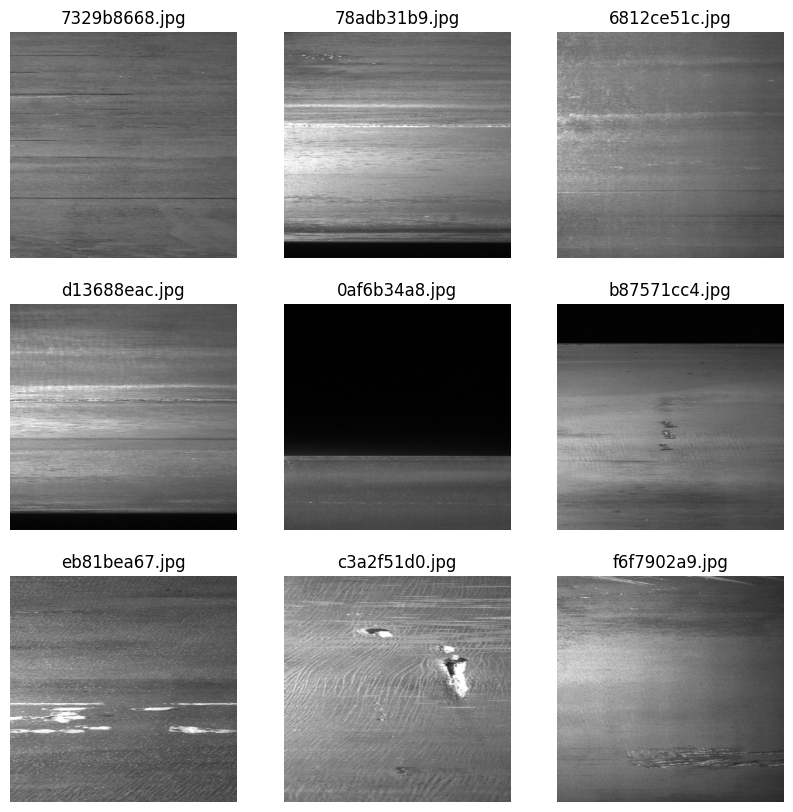

In [ ]:
fig, ax = plt.subplots(rows, cols, figsize=(10,10))
for i, ax in enumerate(ax.flat):
  if i < len(random_images):
    img = read_image(f"{'./train_images'}/{random_images[i]}")
    img = np.rot90(img)
    img = np.rot90(img)
    img = np.rot90(img)
    ax.set_title(f"{random_images[i]}")
    ax.imshow(img)
    ax.axis('off')

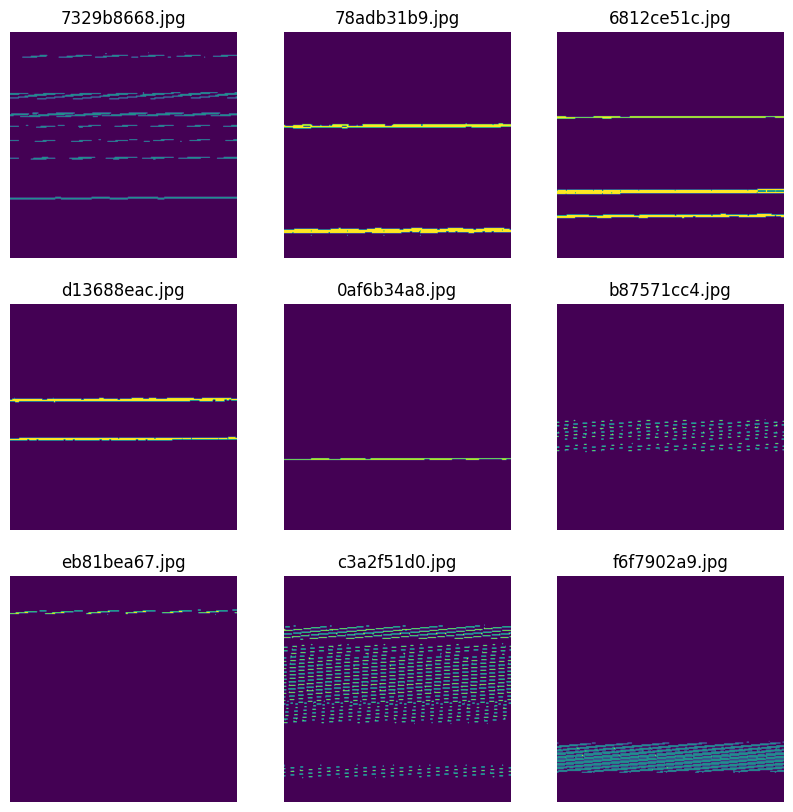

In [ ]:
fig, ax = plt.subplots(rows, cols, figsize = (10, 10))
for i, ax in enumerate(ax.flat):
  if i < len(random_images):
    file = random_images[i]
    if os.path.exists(os.path.join('./train_masks', file)):
      img =  read_image(f"{'./train_masks'}/{file}")
      img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
      ax.set_title(f"{random_images[i]}")
      ax.imshow(img)
      ax.axis('off')
    else:
      print('not exist')

In [ ]:
MASKS = np.zeros((1,  image_size, image_size, 1), dtype=bool)
IMAGES = np.zeros((1, image_size, image_size, 3), dtype=np.uint8)

for j, file in enumerate(masks_listdir[0:number]):
  try:
    image = read_image(f"{'./train_images'}/{file}")
    image = np.rot90(image)
    image = np.rot90(image)
    image = np.rot90(image)
    image_ex = np.expand_dims(image, axis=0)
    IMAGES = np.vstack([IMAGES, image_ex])
    file2 = file[0:-4]+'.jpg'
    mask = read_image(f"{'./train_masks'}/{file2}")
    mask = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)
    mask = mask.reshape(image_size, image_size, 1)
    mask_ex = np.expand_dims(mask, axis=0)
    MASKS = np.vstack([MASKS, mask_ex])
  except:
    print(file)
    continue

In [ ]:
TIMAGES=np.zeros((1,image_size, image_size, 3),dtype=np.uint8)

for j,file in enumerate(test_images_listdir[0:number]): ##the smaller, the faster
    try:
        image = read_image(f"{'./test_images'}/{file}")
        image_ex = np.expand_dims(image, axis=0)
        TIMAGES = np.vstack([TIMAGES, image_ex])

    except:
        print(file)
        continue

In [ ]:
images=np.array(IMAGES)[1:number]
masks=np.array(MASKS)[1:number]
print(images.shape,masks.shape)

test_images=np.array(TIMAGES)[1:number]
print(test_images.shape,masks.shape)

(499, 512, 512, 3) (499, 512, 512, 1)
(499, 512, 512, 3) (499, 512, 512, 1)


In [ ]:
def conv_block(input, num_filters):
    conv = tf.keras.layers.Conv2D(num_filters, 3, padding="same")(input)
    conv = tf.keras.layers.BatchNormalization()(conv)
    conv = tf.keras.layers.Activation("relu")(conv)
    conv = tf.keras.layers.Conv2D(num_filters, 3, padding="same")(conv)
    conv = tf.keras.layers.BatchNormalization()(conv)
    conv = tf.keras.layers.Activation("relu")(conv)
    return conv

def encoder_block(input, num_filters):
    skip = conv_block(input, num_filters)
    pool = tf.keras.layers.MaxPool2D((2, 2))(skip)
    return skip, pool

def decoder_block(input, skip, num_filters):
    up_conv = tf.keras.layers.Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(input)
    conv = tf.keras.layers.Concatenate()([up_conv, skip])
    conv = conv_block(conv, num_filters)
    return conv

def Unet(input_shape):
    inputs = tf.keras.layers.Input(input_shape)

    skip1, pool1 = encoder_block(inputs, 64)
    skip2, pool2 = encoder_block(pool1, 128)
    skip3, pool3 = encoder_block(pool2, 256)
    skip4, pool4 = encoder_block(pool3, 512)

    bridge = conv_block(pool4, 1024)

    decode1 = decoder_block(bridge, skip4, 512)
    decode2 = decoder_block(decode1, skip3, 256)
    decode3 = decoder_block(decode2, skip2, 128)
    decode4 = decoder_block(decode3, skip1, 64)

    outputs = tf.keras.layers.Conv2D(1, 1, padding="same", activation="sigmoid")(decode4)

    model = tf.keras.models.Model(inputs, outputs, name="U-Net")
    return model

unet_model = Unet((512,512,3))
unet_model.compile(optimizer='nadam', loss='binary_crossentropy', metrics=['accuracy'])
unet_model.summary()

Model: "U-Net"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 512, 512, 64  1792        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 512, 512, 64  256        ['conv2d[0][0]']                 
 alization)                     )                                                             

In [ ]:
images_train, images_test, masks_train, masks_test = train_test_split(
    images, masks, test_size=0.2, random_state=42
)

In [ ]:
def show_result(og, unet, target, p):
  fig, axs =  plt.subplots(1, 3, figsize=(12, 12))
  ax[0].set_title("Original")
  axs[0].imshow(og)
  axs[0].axis("off")

  axs[1].set_title("U-Net: p>"+str(p))
  axs[1].imshow(unet)
  axs[1].axis("off")

  axs[2].set_title("Ground Truth")
  axs[2].imshow(target)
  axs[2].axis('off')

  plt.show()

In [ ]:
from functools import partial

def Unet(input_shape):
  DefaultConv2D = partial(tf.keras.layers.Conv2D, kernel_size=(3,3), activation='relu', padding='same')
  DefaultConv2DTranspose = partial(tf.keras.layers.Conv2DTranspose, kernel_size=(2,2), strides=(2,2), padding="same")

  inputs = tf.keras.layers.Input(input_shape)

  c1 = DefaultConv2D(8)(inputs)
  c1 = DefaultConv2D(8)(c1)
  p1 = tf.keras.layers.MaxPooling2D((2,2))(c1)

  c2 = DefaultConv2D(16)(p1)
  c2 = DefaultConv2D(16)(c2)
  p2 = tf.keras.layers.MaxPooling2D((2,2))(c2)

  c3 = DefaultConv2D(32)(p2)
  c3 = DefaultConv2D(32)(c3)
  p3 = tf.keras.layers.MaxPooling2D((2,2))(c3)

  c4 = DefaultConv2D(64)(p3)
  c4 = DefaultConv2D(64)(c4)
  p4 = tf.keras.layers.MaxPooling2D((2,2))(c4)

  c5 = DefaultConv2D(128)(p4)
  c5 = DefaultConv2D(128)(c5)
  p5 = tf.keras.layers.MaxPooling2D((2,2))(c5)

  c55 = DefaultConv2D(128)(p5)
  c55 = DefaultConv2D(128)(c55)

  u6 = DefaultConv2DTranspose(64)(c55)
  u6 = tf.keras.layers.Concatenate()([u6, c5])
  c6 = DefaultConv2D(64)(u6)
  c6 = DefaultConv2D(64)(c6)

  u71 = DefaultConv2DTranspose(32)(c6)
  u71 = tf.keras.layers.Concatenate()([u71, c4])
  c71 = DefaultConv2D(32)(u71)
  c61 = DefaultConv2D(32)(c71)

  u7 = DefaultConv2DTranspose(32)(c61)
  u7 = tf.keras.layers.Concatenate()([u7, c3])
  c7 = DefaultConv2D(16)(u7)
  c7 = DefaultConv2D(16)(c7)

  u8 = DefaultConv2DTranspose(16)(c7)
  u8 = tf.keras.layers.Concatenate()([u8, c2])
  c8 = DefaultConv2D(16)(u8)
  c8 = DefaultConv2D(16)(c8)

  u9 = DefaultConv2DTranspose(8)(c8)
  u9 = tf.keras.layers.Concatenate(axis=3)([u9, c1])
  c9 = DefaultConv2D(8)(u9)
  c9 = DefaultConv2D(8)(c9)

  outputs = tf.keras.layers.Conv2D(1, (1,1), activation='sigmoid')(c9)

  model = tf.keras.models.Model(inputs, outputs, name="U-Net")
  return model

unet_model = Unet((512, 512, 3))
unet_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=["accuracy"])
unet_model.summary()

Model: "U-Net"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_19 (Conv2D)             (None, 512, 512, 8)  224         ['input_2[0][0]']                
                                                                                                  
 conv2d_20 (Conv2D)             (None, 512, 512, 8)  584         ['conv2d_19[0][0]']              
                                                                                                  
 max_pooling2d_4 (MaxPooling2D)  (None, 256, 256, 8)  0          ['conv2d_20[0][0]']          

In [ ]:
unet_result = unet_model.fit(
    images_train, masks_train,
    validation_split=0.2, batch_size=4, epochs=120
)

Epoch 1/120
80/80 [==============================] - 32s 116ms/step - loss: 0.3567 - accuracy: 0.9339 - val_loss: 0.1810 - val_accuracy: 0.9570
Epoch 2/120
80/80 [==============================] - 6s 71ms/step - loss: 0.2635 - accuracy: 0.9417 - val_loss: 0.1889 - val_accuracy: 0.9571
Epoch 3/120
80/80 [==============================] - 5s 69ms/step - loss: 0.2259 - accuracy: 0.9416 - val_loss: 0.1777 - val_accuracy: 0.9572
Epoch 4/120
80/80 [==============================] - 6s 73ms/step - loss: 0.2172 - accuracy: 0.9419 - val_loss: 0.1720 - val_accuracy: 0.9574
Epoch 5/120
80/80 [==============================] - 6s 70ms/step - loss: 0.2144 - accuracy: 0.9420 - val_loss: 0.1763 - val_accuracy: 0.9573
Epoch 6/120
80/80 [==============================] - 6s 75ms/step - loss: 0.2102 - accuracy: 0.9419 - val_loss: 0.1672 - val_accuracy: 0.9574
Epoch 7/120
80/80 [==============================] - 6s 75ms/step - loss: 0.2044 - accuracy: 0.9421 - val_loss: 0.1773 - val_accuracy: 0.9574
Epoc

In [ ]:
def show_result(og, unet, target, p):

    fig, axs = plt.subplots(1, 3, figsize=(12,12))
    axs[0].set_title("Original")
    axs[0].imshow(og)
    axs[0].axis('off')

    axs[1].set_title("U-Net: p>"+str(p))
    axs[1].imshow(unet)
    axs[1].axis('off')

    axs[2].set_title("Ground Truth")
    axs[2].imshow(target)
    axs[2].axis('off')

    plt.show()

In [ ]:
unet_predict = unet_model.predict(images_test)

4/4 [==============================] - 5s 89ms/step


In [ ]:
unet_predict1 = (unet_predict > 0.1).astype(np.uint8)
unet_predict2 = (unet_predict > 0.2).astype(np.uint8)
unet_predict3 = (unet_predict > 0.3).astype(np.uint8)
unet_predict4 = (unet_predict > 0.4).astype(np.uint8)

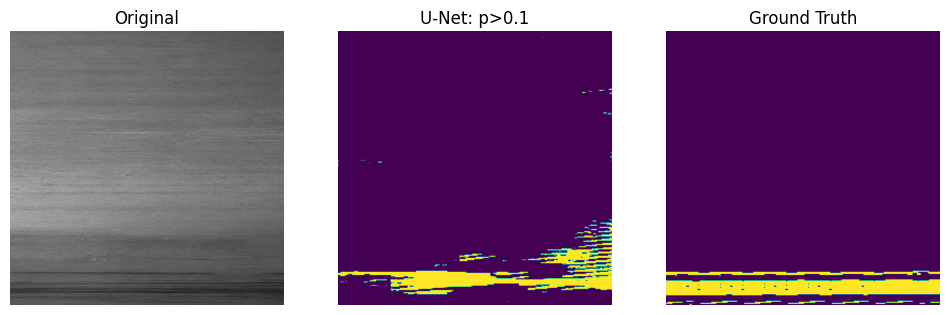

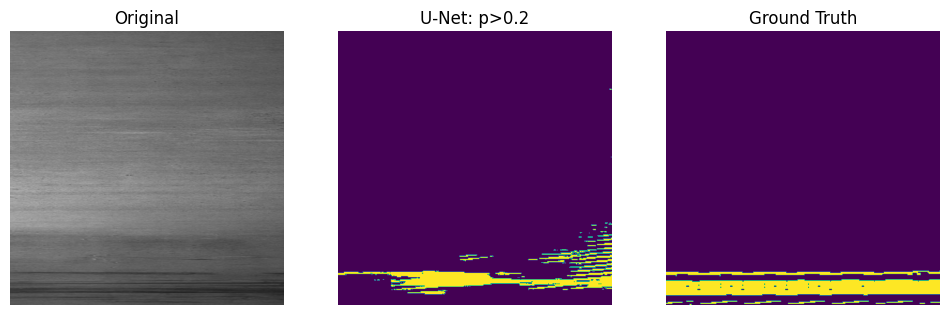

In [ ]:
show_test_idx = random.sample(range(len(unet_predict)), 3)
for idx in show_test_idx:
    show_result(images_test[idx], unet_predict1[idx], masks_test[idx], 0.1)
    show_result(images_test[idx], unet_predict2[idx], masks_test[idx], 0.2)
    show_result(images_test[idx], unet_predict3[idx], masks_test[idx], 0.3)
    show_result(images_test[idx], unet_predict4[idx], masks_test[idx], 0.4)

In [ ]:
def show_result2(og, unet, p):

    fig, axs = plt.subplots(1, 2, figsize=(12,12))
    axs[0].set_title("Original")
    axs[0].imshow(og)
    axs[0].axis('off')

    axs[1].set_title("U-Net: p>"+str(p))
    axs[1].imshow(unet)
    axs[1].axis('off')

    plt.show()

In [ ]:
unet_predictT = unet_model.predict(test_images)

In [ ]:
unet_predict1 = (unet_predictT > 0.1).astype(np.uint8)
unet_predict2 = (unet_predictT > 0.2).astype(np.uint8)
unet_predict3 = (unet_predictT > 0.3).astype(np.uint8)
unet_predict4 = (unet_predictT > 0.4).astype(np.uint8)

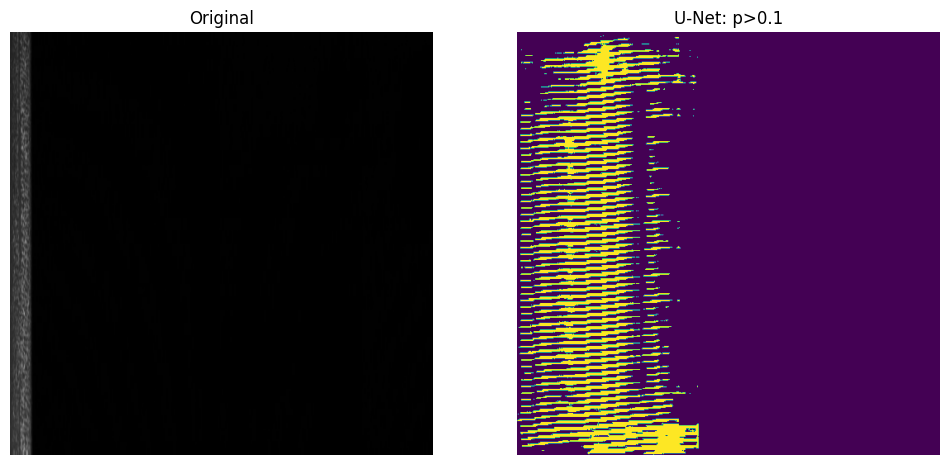

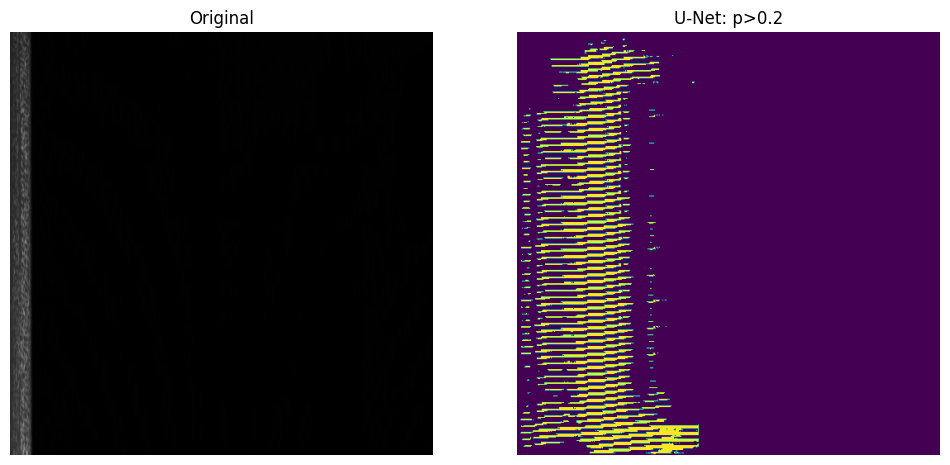

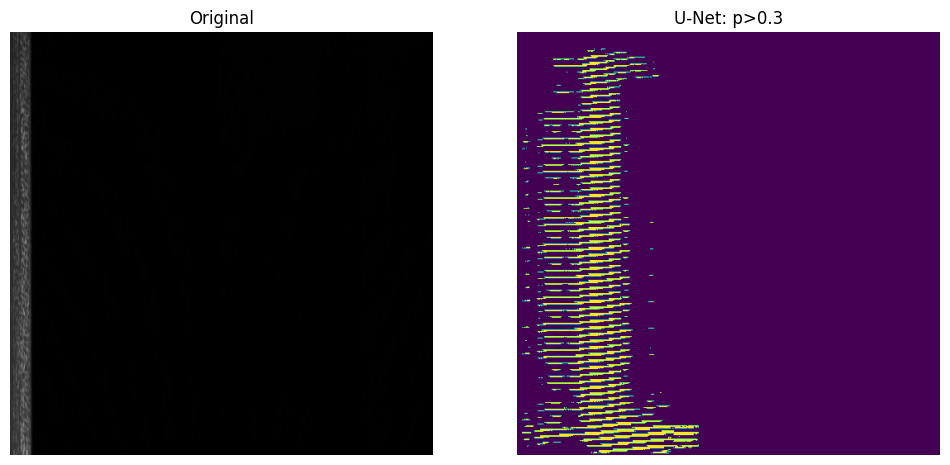

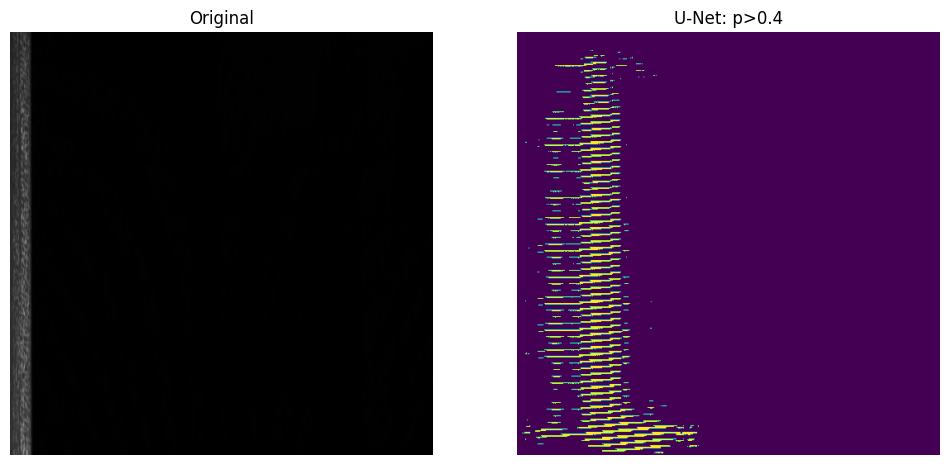

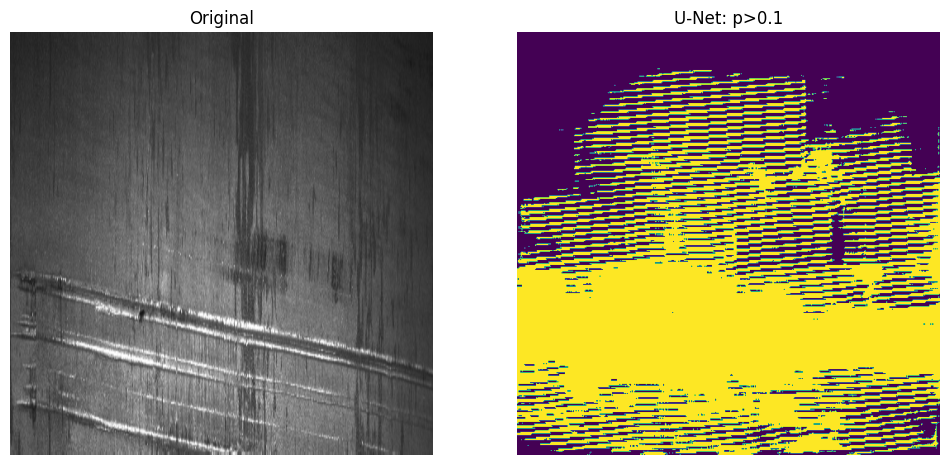

...

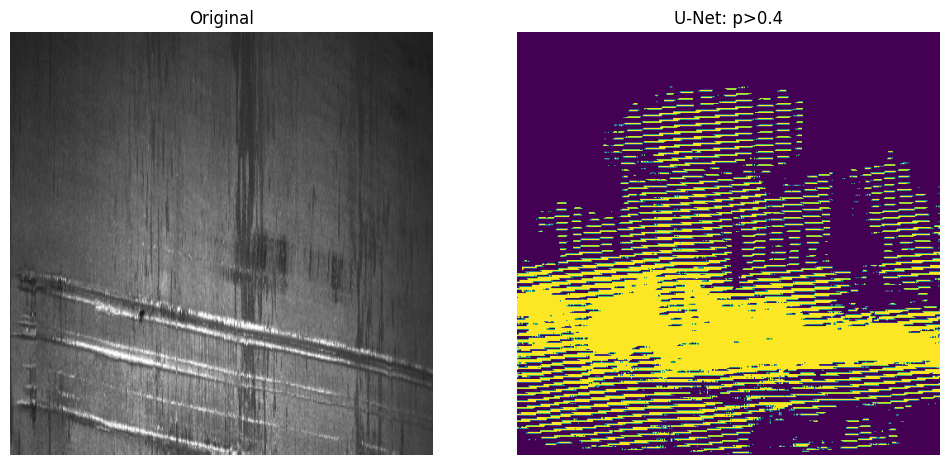

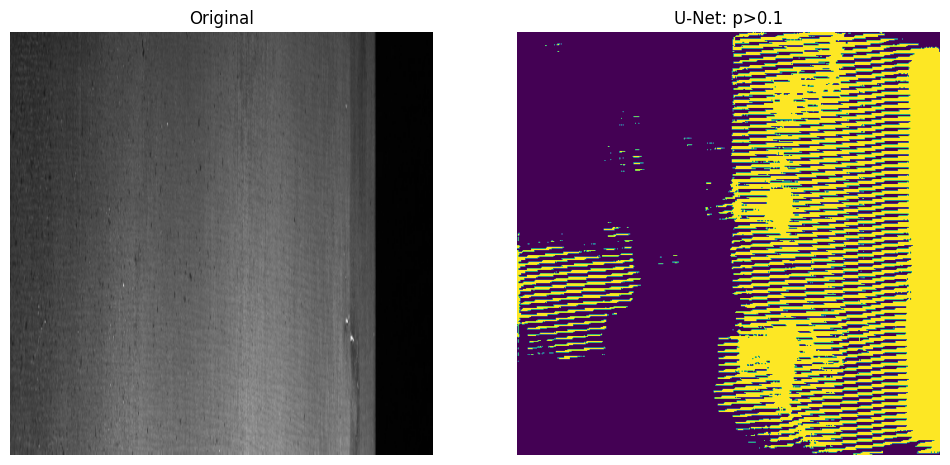

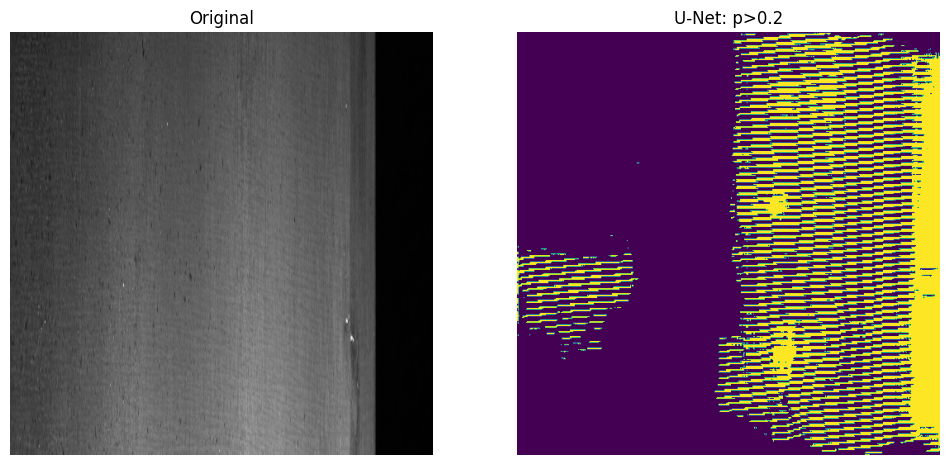

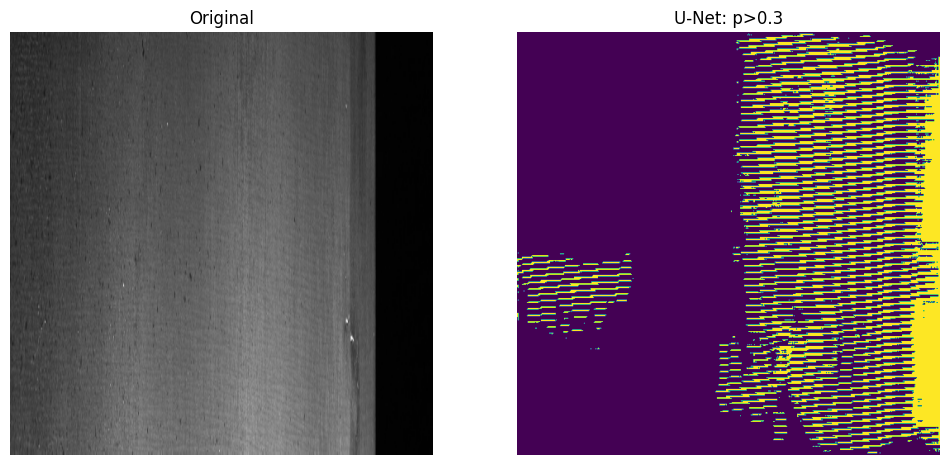

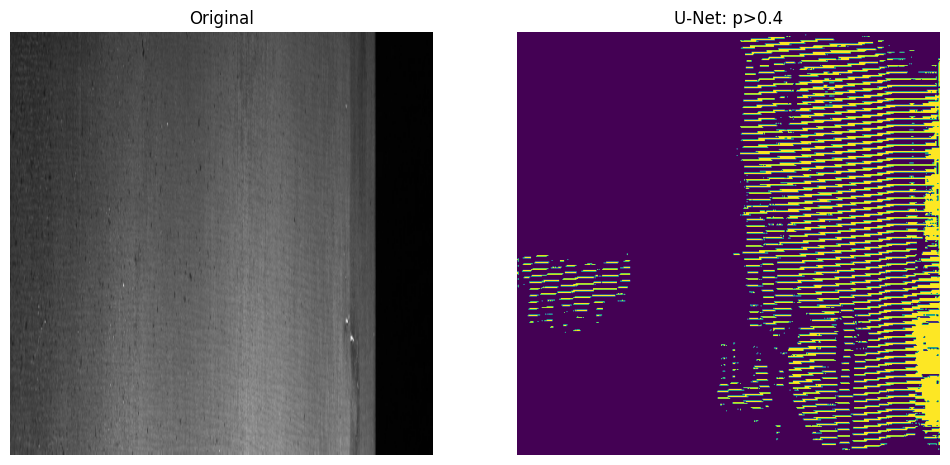

In [ ]:
show_test_idx = random.sample(range(len(unet_predictT)), 3)
for idx in show_test_idx:
    show_result2(test_images[idx], unet_predict1[idx], 0.1)
    show_result2(test_images[idx], unet_predict2[idx], 0.2)
    show_result2(test_images[idx], unet_predict3[idx], 0.3)
    show_result2(test_images[idx], unet_predict4[idx], 0.4)